In [804]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
import warnings
import shap

from analyzer.metric import MetricCalculator
from data.io import Reader, Saver
from data.plot import Drawer
from analyzer.stat_criterion.stat_criteria import StatCriteria
from data.encoder import Encoder
from data.normalizer import Normalizer
from data import DataPreparation

from sklearn.decomposition import PCA, KernelPCA, IncrementalPCA
from sklearn.preprocessing import FunctionTransformer
from sklearn.random_projection import GaussianRandomProjection
from sklearn.manifold import TSNE, MDS, Isomap, LocallyLinearEmbedding
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression, ElasticNet, BayesianRidge, SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, AdaBoostRegressor, BaggingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor, Pool
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
from factor_analyzer.factor_analyzer import calculate_kmo
from factor_analyzer import FactorAnalyzer
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr, f_oneway
from sklearn.feature_selection import RFE
from skopt import BayesSearchCV

# Постановка задачи
1. Применить факторный анализ к датасету.
2. Интерпретировать факторы и дать им названия.

датасет:
https://raw.githubusercontent.com/Semendyeav/datasets/refs/heads/main/PDA200_P1_wine.csv

# Выгрузка и проверка целостности датасета

In [805]:
# читаем датасет в память из внешнего источника
df_original = Reader.read_csv("https://raw.githubusercontent.com/Semendyeav/datasets/refs/heads/main/PDA200_P1_wine.csv")
Saver.save_csv(df_original, "PDA200_practice2", False)
df = df_original.copy().reset_index(drop=True)
df.head(10)

Файл успешно сохранён: ./dataset/PDA200_practice2.csv


,alcohol,malic_acid,ash,ash_alcanity,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280,proline,customer_segment
0,11.56,2.05,3.23,28.5,119,3.18,5.08,0.47,1.87,6.00,0.93,3.69,465,2
1,12.33,0.99,1.95,14.8,136,1.90,1.85,0.35,2.76,3.40,1.06,2.31,750,2
2,13.11,1.90,2.75,25.5,116,2.20,1.28,0.26,1.56,7.10,0.61,1.33,425,3
3,13.73,4.36,2.26,22.5,88,1.28,0.47,0.52,1.15,6.62,0.78,1.75,520,3
4,14.10,2.16,2.30,18.0,105,2.95,3.32,0.22,2.38,5.75,1.25,3.17,1510,1
5,14.22,3.99,2.51,13.2,128,3.00,3.04,0.20,2.08,5.10,0.89,3.53,760,1
6,12.51,1.24,2.25,17.5,85,2.00,0.58,0.60,1.25,5.45,0.75,1.51,650,3
7,13.88,1.89,2.59,15.0,101,3.25,3.56,0.17,1.70,5.43,0.88,3.56,1095,1
8,12.04,4.30,2.38,22.0,80,2.10,1.75,0.42,1.35,2.60,0.79,2.57,580,2
9,13.40,4.60,2.86,25.0,112,1.98,0.96,0.27,1.11,8.50,0.67,1.92,630,3


In [806]:
# смотрим на типы данных и требования к памяти
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   alcohol               178 non-null    float64
 1   malic_acid            178 non-null    float64
 2   ash                   178 non-null    float64
 3   ash_alcanity          178 non-null    float64
 4   magnesium             178 non-null    int64  
 5   total_phenols         178 non-null    float64
 6   flavanoids            178 non-null    float64
 7   nonflavanoid_phenols  178 non-null    float64
 8   proanthocyanins       178 non-null    float64
 9   color_intensity       178 non-null    float64
 10  hue                   178 non-null    float64
 11  od280                 178 non-null    float64
 12  proline               178 non-null    int64  
 13  customer_segment      178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [807]:
# посмотрим на пропуски в данных
df.isna().sum()

alcohol                 0
malic_acid              0
ash                     0
ash_alcanity            0
magnesium               0
total_phenols           0
flavanoids              0
nonflavanoid_phenols    0
proanthocyanins         0
color_intensity         0
hue                     0
od280                   0
proline                 0
customer_segment        0
dtype: int64

In [808]:
# Посмотрим статистику о датасете
df.describe().T

,count,mean,std,min,25%,50%,75%,max
alcohol,178.0,13.000618,0.811827,11.03,12.3625,13.050,13.6775,14.83
malic_acid,178.0,2.336348,1.117146,0.74,1.6025,1.865,3.0825,5.80
ash,178.0,2.366517,0.274344,1.36,2.2100,2.360,2.5575,3.23
ash_alcanity,178.0,19.494944,3.339564,10.60,17.2000,19.500,21.5000,30.00
magnesium,178.0,99.741573,14.282484,70.00,88.0000,98.000,107.0000,162.00
total_phenols,178.0,2.295112,0.625851,0.98,1.7425,2.355,2.8000,3.88
flavanoids,178.0,2.029270,0.998859,0.34,1.2050,2.135,2.8750,5.08
nonflavanoid_phenols,178.0,0.361854,0.124453,0.13,0.2700,0.340,0.4375,0.66
proanthocyanins,178.0,1.590899,0.572359,0.41,1.2500,1.555,1.9500,3.58
color_intensity,178.0,5.058090,2.318286,1.28,3.2200,4.690,6.2000,13.00


# Оптимизация датасета

In [809]:
df['magnesium'] = df['magnesium'].astype('uint8')
df['proline'] = df['proline'].astype('uint16')
df['customer_segment'] = df['customer_segment'].astype('uint8')

df['malic_acid'] = df['malic_acid'].astype('float32')
df['ash'] = df['ash'].astype('float32')
df['ash_alcanity'] = df['ash_alcanity'].astype('float32')
df['total_phenols'] = df['total_phenols'].astype('float32')
df['flavanoids'] = df['flavanoids'].astype('float32')
df['nonflavanoid_phenols'] = df['nonflavanoid_phenols'].astype('float32')
df['proanthocyanins'] = df['proanthocyanins'].astype('float32')
df['color_intensity'] = df['color_intensity'].astype('float32')
df['hue'] = df['hue'].astype('float32')
df['od280'] = df['od280'].astype('float32')

In [810]:
# проверяем
df.describe().T

,count,mean,std,min,25%,50%,75%,max
alcohol,178.0,13.000618,0.811827,11.03,12.362500,13.050,13.6775,14.83
malic_acid,178.0,2.336348,1.117146,0.74,1.602500,1.865,3.0825,5.80
ash,178.0,2.366517,0.274344,1.36,2.210000,2.360,2.5575,3.23
ash_alcanity,178.0,19.494944,3.339564,10.60,17.200001,19.500,21.5000,30.00
magnesium,178.0,99.741573,14.282484,70.00,88.000000,98.000,107.0000,162.00
total_phenols,178.0,2.295112,0.625851,0.98,1.742500,2.355,2.8000,3.88
flavanoids,178.0,2.029270,0.998859,0.34,1.205000,2.135,2.8750,5.08
nonflavanoid_phenols,178.0,0.361854,0.124453,0.13,0.270000,0.340,0.4375,0.66
proanthocyanins,178.0,1.590899,0.572359,0.41,1.250000,1.555,1.9500,3.58
color_intensity,178.0,5.058090,2.318286,1.28,3.220000,4.690,6.2000,13.00


In [811]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   alcohol               178 non-null    float64
 1   malic_acid            178 non-null    float32
 2   ash                   178 non-null    float32
 3   ash_alcanity          178 non-null    float32
 4   magnesium             178 non-null    uint8  
 5   total_phenols         178 non-null    float32
 6   flavanoids            178 non-null    float32
 7   nonflavanoid_phenols  178 non-null    float32
 8   proanthocyanins       178 non-null    float32
 9   color_intensity       178 non-null    float32
 10  hue                   178 non-null    float32
 11  od280                 178 non-null    float32
 12  proline               178 non-null    uint16 
 13  customer_segment      178 non-null    uint8  
dtypes: float32(10), float64(1), uint16(1), uint8(2)
memory usage: 9.2 KB


# Первичный визуальный анализ зависимостей в данных

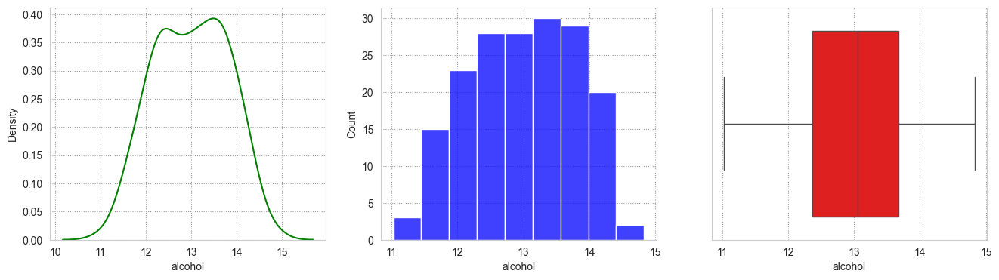

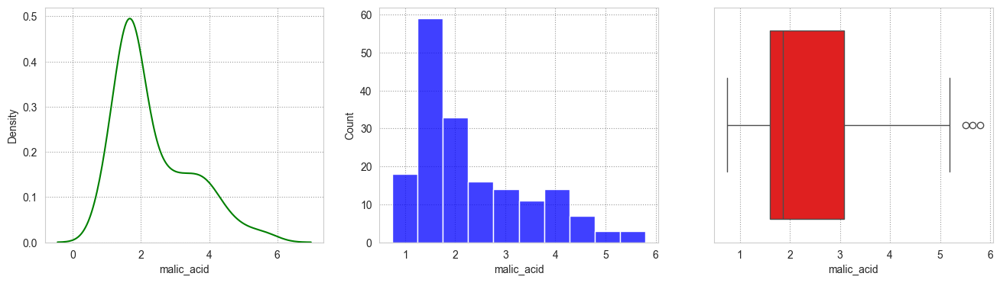

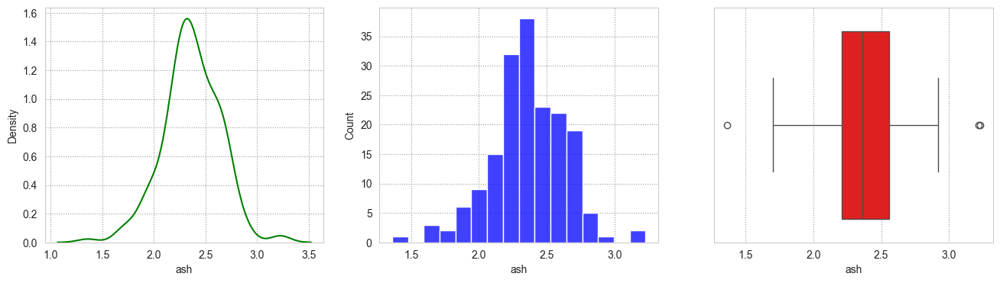

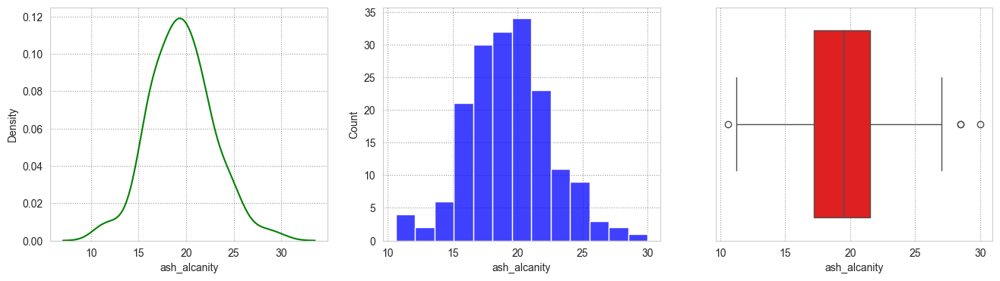

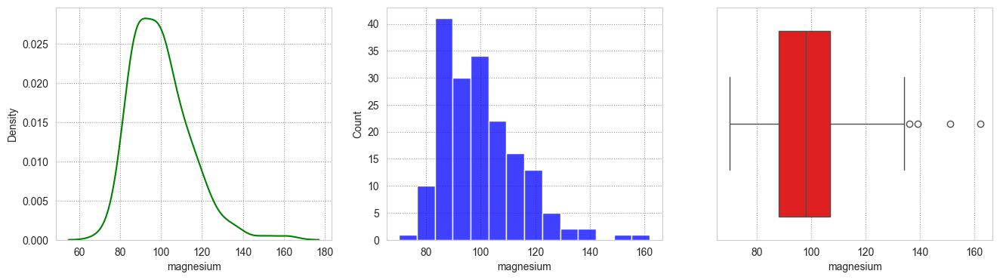

...

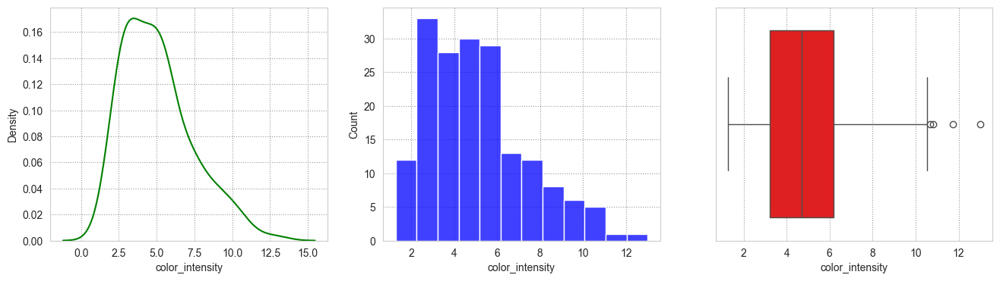

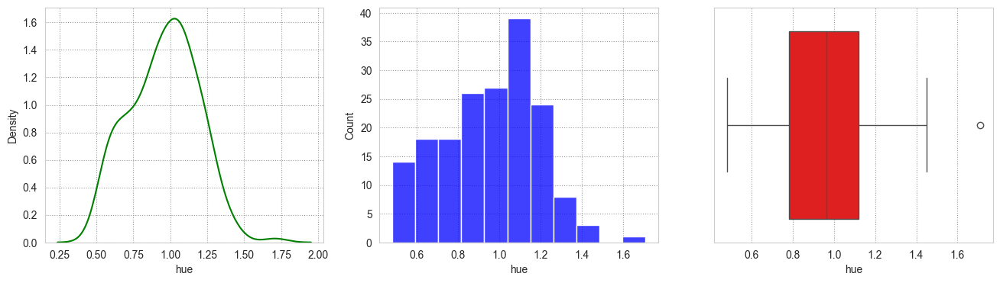

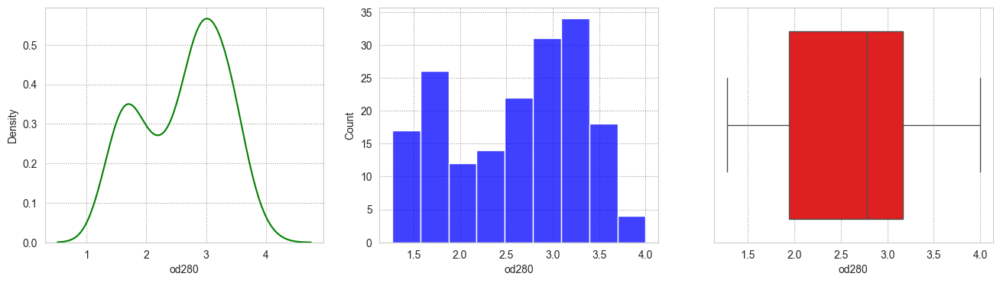

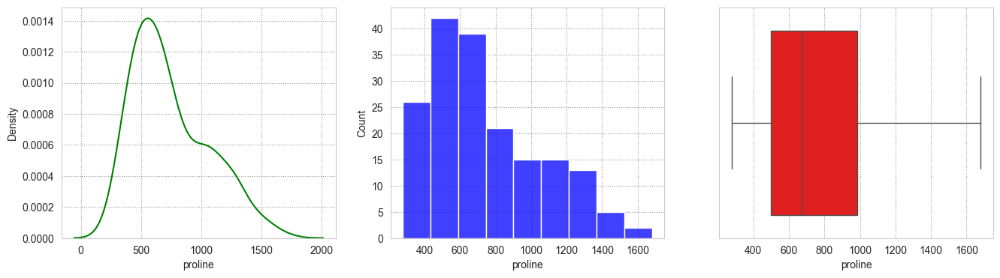

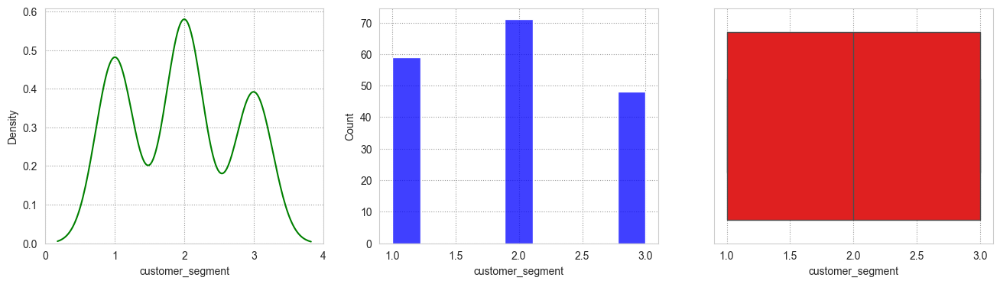

In [812]:
# Посмотрим на виды распределений "числовых" параметров и на ящики с усами
Drawer.plot_numeric_seaborn(df)

In [813]:
# Посмотрим на распределение категориальных величин
Drawer.plot_categorical_seaborn(df)

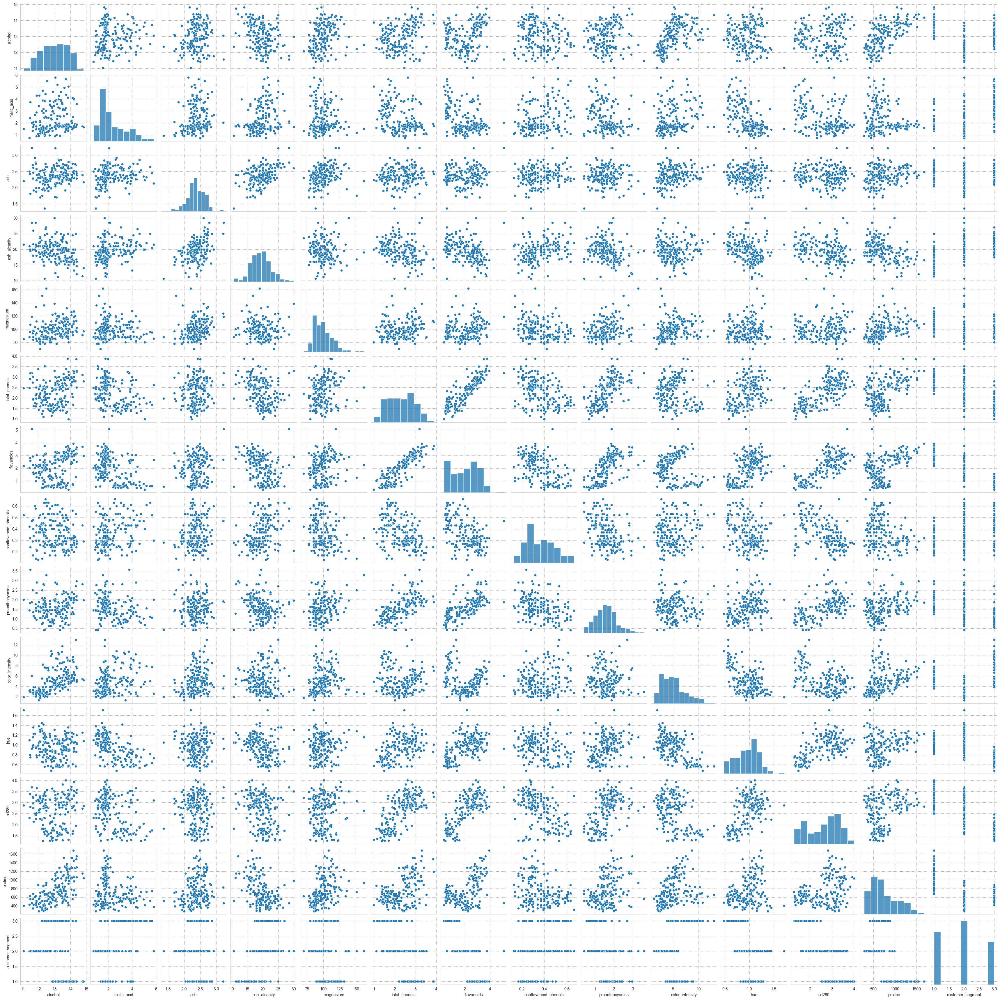

In [814]:
numeric_col = df.describe().columns
sns.pairplot(df[numeric_col])

# Анализ взаимосвязей в данных

## подготовим данные для поиска модели через кросс-валидацию

In [815]:
# разделяем данные
target = ['alcohol']
list_of_exclude_features = []
exclude_features = target
list_of_exclude_features.append(exclude_features)

y = df[target]
X = df.drop(exclude_features , axis=1)

# нормализуем
X, _, _ = Normalizer().MinMaxScaler(X, X)
X, _, y, _ = Normalizer().reset_index(X, X, y, y)

## проверка на мультиколлениарность

In [816]:
# Проверим допущение о мультиколлинеарности признаков
exclude_features = target
StatCriteria().VIF(df, exclude_features)

,VIF
malic_acid,8.328487
ash,163.363912
ash_alcanity,88.586764
magnesium,63.893024
total_phenols,64.603756
flavanoids,46.200014
nonflavanoid_phenols,16.254510
proanthocyanins,17.189758
color_intensity,15.955060
hue,39.620487


## оценка корреляций

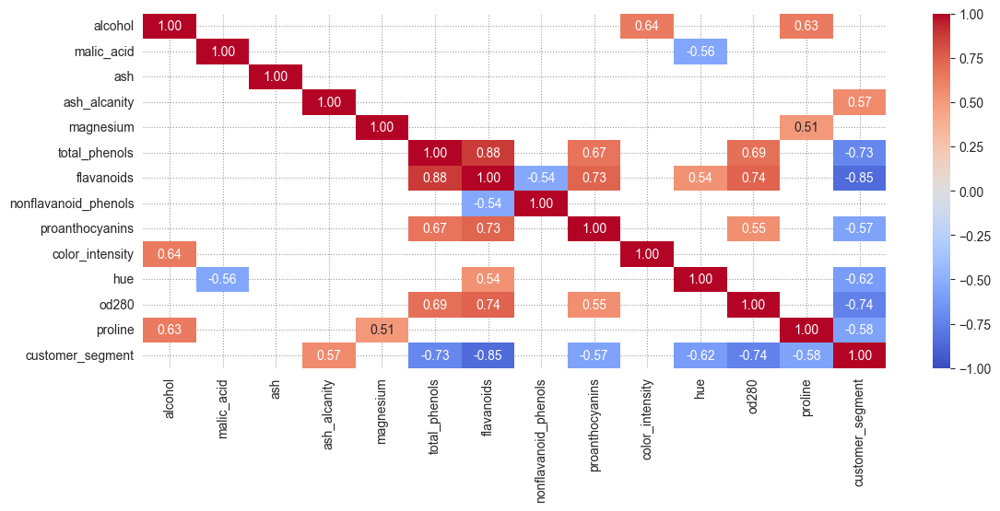

In [817]:
# Исследуем тепловую карту корреляции непрерывных признаков
Drawer.plot_heatmap(df, method='spearman', boundary=0.5)

In [818]:
# проверяем распределения между таргетом и признаками
for column in df.select_dtypes(include='number').drop(columns=target).columns:
    print(f"\n{column} и {target}:")
    groups = [df[column], df[target[0]]]
    StatCriteria().mannwhitneyu(groups)


malic_acid и ['alcohol']:
Mann-Whitney U test
U_statistic = 0.000
Распределения двух выборок не равны (p-value = 0.000).

ash и ['alcohol']:
Mann-Whitney U test
U_statistic = 0.000
Распределения двух выборок не равны (p-value = 0.000).

ash_alcanity и ['alcohol']:
Mann-Whitney U test
U_statistic = 30743.500
Распределения двух выборок не равны (p-value = 0.000).

magnesium и ['alcohol']:
Mann-Whitney U test
U_statistic = 31684.000
Распределения двух выборок не равны (p-value = 0.000).

total_phenols и ['alcohol']:
Mann-Whitney U test
U_statistic = 0.000
Распределения двух выборок не равны (p-value = 0.000).

flavanoids и ['alcohol']:
Mann-Whitney U test
U_statistic = 0.000
Распределения двух выборок не равны (p-value = 0.000).

nonflavanoid_phenols и ['alcohol']:
Mann-Whitney U test
U_statistic = 0.000
Распределения двух выборок не равны (p-value = 0.000).

proanthocyanins и ['alcohol']:
Mann-Whitney U test
U_statistic = 0.000
Распределения двух выборок не равны (p-value = 0.000).

col

## корреляционный отбор признаков

In [819]:
# Разделим признаки на числовые и категориальные
numerical_features = df.select_dtypes(include=['number']).columns.drop(target)
categorical_features = df.select_dtypes(include=['object', 'category']).columns

# Списки для исключения
exclude_features_2 = []

# Анализ для числовых признаков
print("Анализ для числовых признаков:")
for feature in numerical_features:
    # Коэффициент корреляции Спирмана
    spearman_corr, _ = spearmanr(df[feature], df[target])
    print(f"{feature} и {target}: Spearman correlation = {spearman_corr:.2f}")

    # Если корреляция слабая, добавляем признак в список на исключение
    if abs(spearman_corr) < 0.5:
        exclude_features_2.append(feature)
        print(f"Признак {feature} будет исключен (слабая корреляция).")

# # Анализ для категориальных признаков
# print("\nАнализ для категориальных признаков:")
# for feature in categorical_features:
#     # Группируем данные по категориям и применяем ANOVA
#     groups = [df[df[feature] == category][target] for category in df[feature].unique()]
#     f_stat, p_value = f_oneway(*groups)
#     print(f"{feature} и {target}: F-statistic = {f_stat:.2f}, p-value = {p_value:.4f}")
# 
#     # Если p-значение больше порога, добавляем признак в список на исключение
#     if p_value > 0.05:
#         features_to_drop.append(feature)
#         print(f"Признак {feature} будет исключен (p-value > {0.05}).")

# Исключаем признаки
exclude_features_2.append(target)
print("\nИсключенные признаки:", exclude_features_2)
list_of_exclude_features.append(exclude_features_2)

Анализ для числовых признаков:
malic_acid и ['alcohol']: Spearman correlation = 0.14
Признак malic_acid будет исключен (слабая корреляция).
ash и ['alcohol']: Spearman correlation = 0.24
Признак ash будет исключен (слабая корреляция).
ash_alcanity и ['alcohol']: Spearman correlation = -0.31
Признак ash_alcanity будет исключен (слабая корреляция).
magnesium и ['alcohol']: Spearman correlation = 0.37
Признак magnesium будет исключен (слабая корреляция).
total_phenols и ['alcohol']: Spearman correlation = 0.31
Признак total_phenols будет исключен (слабая корреляция).
flavanoids и ['alcohol']: Spearman correlation = 0.29
Признак flavanoids будет исключен (слабая корреляция).
nonflavanoid_phenols и ['alcohol']: Spearman correlation = -0.16
Признак nonflavanoid_phenols будет исключен (слабая корреляция).
proanthocyanins и ['alcohol']: Spearman correlation = 0.19
Признак proanthocyanins будет исключен (слабая корреляция).
color_intensity и ['alcohol']: Spearman correlation = 0.64
hue и ['alco

## рекурсивный отбор признаков

In [820]:
# Создание модели CatBoost
model = CatBoostRegressor(iterations=100, learning_rate=0.1, verbose=0)

# RFE
rfe = RFE(model, n_features_to_select=9)
df_rfe = rfe.fit_transform(X, y)

def color_(val):
  color = 'red' if val else ''
  return f'background-color: {color}'
# Выбор признаков
final_df_rfe = pd.DataFrame({"Features" : X.columns, "Importances" : rfe.support_}).set_index('Features')
final_df_rfe.style.map(color_)

,Importances
Features,
malic_acid,False
ash,True
ash_alcanity,True
magnesium,False
total_phenols,False
flavanoids,False
nonflavanoid_phenols,True
proanthocyanins,True
color_intensity,True


In [821]:
mask = final_df_rfe['Importances'] == False
exclude_features_3 = list(set(final_df_rfe[mask].index))
exclude_features_3.append(target)
print(exclude_features_3)
list_of_exclude_features.append(exclude_features_3)

['total_phenols', 'magnesium', 'flavanoids', 'malic_acid', ['alcohol']]


## отбор признаков через catboost

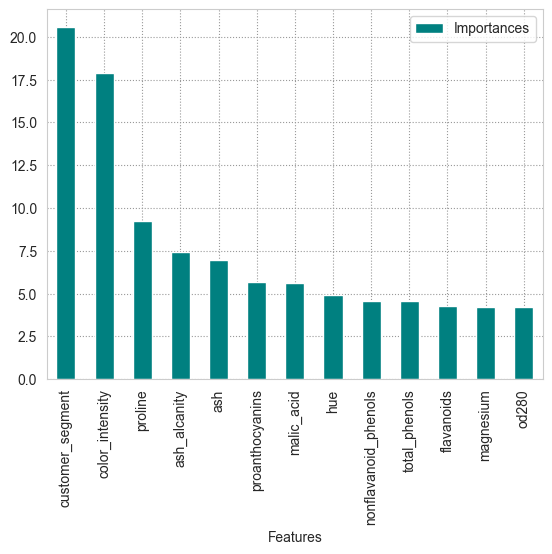

In [822]:
# Создание Pool объекта (CatBoost использует его для эффективной работы с данными)
train_pool = Pool(X, y)

# Обучение модели
model = CatBoostRegressor(verbose=0).fit(train_pool)

# Получение важности признаков
feature_importances = model.get_feature_importance()

final_df_catboost = pd.DataFrame({"Features" : X.columns, "Importances" : feature_importances})
final_df_catboost = final_df_catboost.sort_values(by = 'Importances', ascending=False)
final_df_catboost.set_index('Features', inplace = True)
# Выводим на график
final_df_catboost.plot.bar(color = 'teal')
plt.show()

In [823]:
mask = final_df_catboost['Importances'] < 5
exclude_features_4 = list(set(final_df_catboost[mask].index))
exclude_features_4.append(target)
print(exclude_features_4)
list_of_exclude_features.append(exclude_features_4)

['magnesium', 'od280', 'flavanoids', 'total_phenols', 'nonflavanoid_phenols', 'hue', ['alcohol']]


## отбор признаков через SHAP

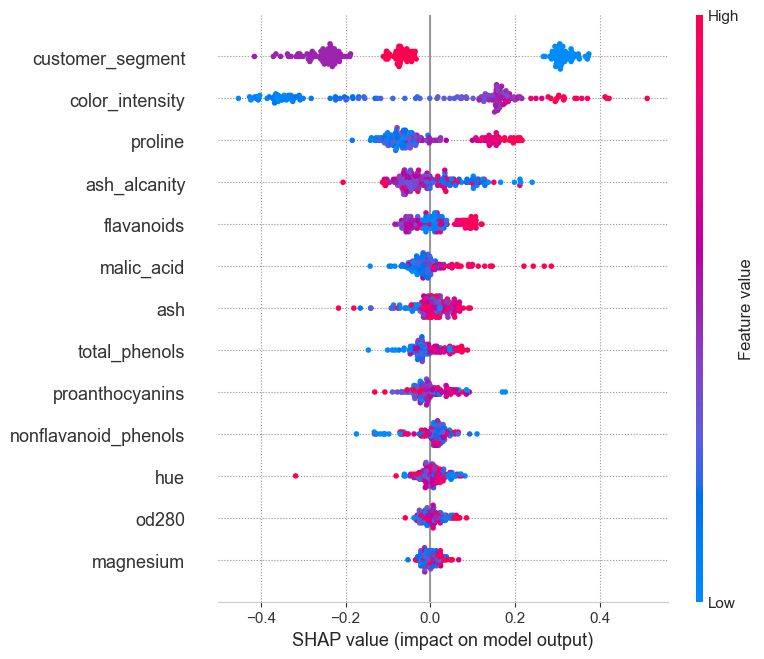

In [824]:
# Отберем признаки с помощью SHAP

# Обучение модели
model = CatBoostRegressor(iterations=100, learning_rate=0.1,
                          logging_level='Silent')
model.fit(X, y)

# Вычисление SHAP-значений
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# Визуализация важности признаков
shap.summary_plot(shap_values, X)

In [825]:
# Вычисление средних абсолютных SHAP-значений для каждого признака
shap_importance = np.abs(shap_values).mean(axis=0)

feature_importance_df = pd.DataFrame({
    'feature': X.columns,
    'shap_importance': shap_importance
}).sort_values(by='shap_importance', ascending=False)

mask_shap = feature_importance_df['shap_importance'] < 0.05
exclude_features_5 = feature_importance_df[mask_shap]['feature'].tolist()
exclude_features_5.append(target)
print(exclude_features_5)
list_of_exclude_features.append(exclude_features_5)

['flavanoids', 'malic_acid', 'ash', 'total_phenols', 'proanthocyanins', 'nonflavanoid_phenols', 'hue', 'od280', 'magnesium', ['alcohol']]


## пересечение признаков

In [826]:
exclude_features_6 = [feature for feature in exclude_features_2 
                       if feature in exclude_features_3 and feature in exclude_features_4  and feature in exclude_features_5]
print(exclude_features_6)
list_of_exclude_features.append(exclude_features_6)

['magnesium', 'total_phenols', 'flavanoids', ['alcohol']]


## поиск оптимального числа компонент

Объясненная дисперсия: [0.539859   0.11804067 0.07113831 0.06666965 0.05218911 0.04102328
 0.02899017 0.0195939  0.01915919 0.0162521  0.01255149 0.00909861
 0.00543468]


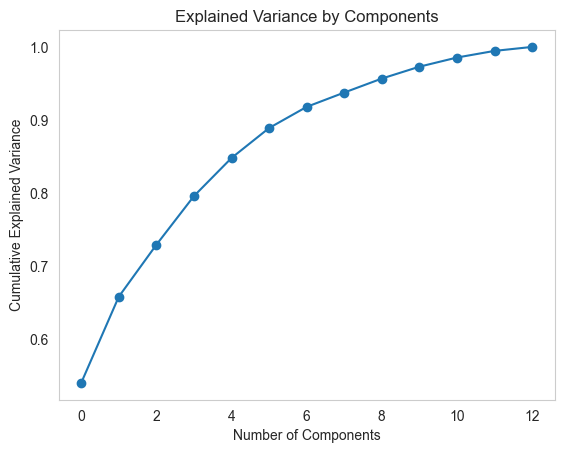

Оптимальное число компонент: 9
Размерность после PCA: (178, 9)


In [827]:
pca = PCA()
pca.fit(X)

# Объясненная дисперсия
explained_variance = pca.explained_variance_ratio_
print("Объясненная дисперсия:", explained_variance)

# Кумулятивная объясненная дисперсия
cumulative_variance = np.cumsum(explained_variance)

# График кумулятивной объясненной дисперсии
plt.plot(cumulative_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Components')
plt.grid()
plt.show()

# Выбор числа компонент, объясняющих 95% дисперсии
n_components = np.argmax(cumulative_variance >= 0.95) + 1
print(f"Оптимальное число компонент: {n_components}")

# Повторное применение PCA с выбранным числом компонент
pca = PCA(n_components=n_components)
X_transformed = pca.fit_transform(X)
print(f"Размерность после PCA: {X_transformed.shape}")

## визуализация трансформаций

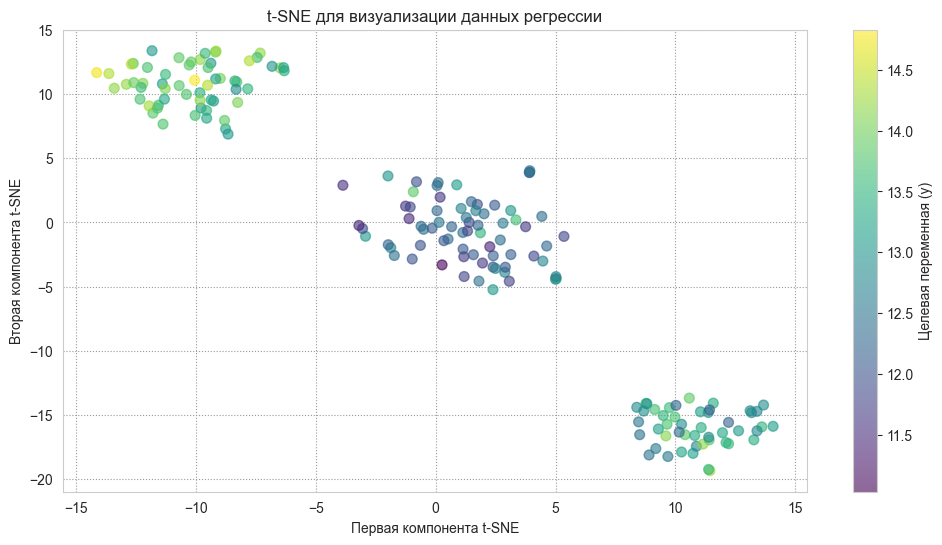

In [828]:
## визуализация через t-SNE
tsne = TSNE(n_components=2, max_iter=1_000)
X_transformed = tsne.fit_transform(X)

# Визуализируем результат
plt.figure(figsize=(12,6))
plt.scatter(X_transformed[:,0], X_transformed[:,1], c=np.array(y), cmap='viridis', s=50, alpha=0.6)
plt.colorbar(label='Целевая переменная (y)')
plt.xlabel('Первая компонента t-SNE')
plt.ylabel('Вторая компонента t-SNE')
plt.title('t-SNE для визуализации данных регрессии')
plt.show()

In [829]:
tsne = TSNE(n_components=3, max_iter=1_000)
X_transformed = tsne.fit_transform(X)

# Создаем DataFrame для визуализации
_df = pd.DataFrame(X_transformed, columns=['Component 1', 'Component 2', 'Component 3'])
_df['age'] = y

# Строим 3D scatter plot
fig = px.scatter_3d(_df,
                    x='Component 1',
                    y='Component 2',
                    z='Component 3',
                    color='age',
                    title='3D t-SNE для визуализации данных регрессии')

fig.show()

In [830]:
LLE = LocallyLinearEmbedding(n_components=3, n_neighbors=6, random_state=42)
X_transformed = LLE.fit_transform(X)

# Создаем DataFrame для визуализации
_df = pd.DataFrame(X_transformed, columns=['Component 1', 'Component 2', 'Component 3'])
_df['age'] = y

# Строим 3D scatter plot
fig = px.scatter_3d(_df,
                    x='Component 1',
                    y='Component 2',
                    z='Component 3',
                    color='age',
                    title='3D LLE для визуализации данных регрессии')
fig.show()

## факторный анализ

In [831]:
# Шаг 1 Проверяем, является ли матрица корреляции единичной
chi2, p_value = calculate_bartlett_sphericity(df)
print("Chi squared value : ", round(chi2, 0))
print("p value : ", round(p_value, 2))
if p_value < 0.05:
    print('Данные подходят для факторного анализа.')
else:
    print('Данные не подходят для факторного анализа.')

Chi squared value :  1710.0
p value :  0.0
Данные подходят для факторного анализа.


In [832]:
# Шаг 2 Если КМО > 0.6, то факторный анализ подойдет для уменьшения размерности
kmo_vars, kmo_model = calculate_kmo(df)
print(f'{kmo_model:.3f}')
if kmo_model > 0.6:
    print('Факторный анализ подходит для уменьшения размерности.')
else:
    print('Факторный анализ не подходит для уменьшения размерности.')

0.797
Факторный анализ подходит для уменьшения размерности.


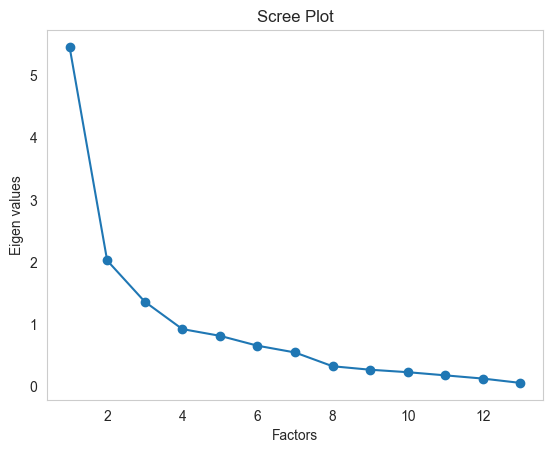

In [833]:
# Шаг 3
warnings.filterwarnings("ignore", category=FutureWarning)

fa = FactorAnalyzer(rotation=None, n_factors=X.shape[1])
X_fa = fa.fit_transform(X)

# Визуализация собственных значений
ev, _ = fa.get_eigenvalues()
plt.scatter(range(1, X_fa.shape[1] + 1), ev)
plt.plot(range(1, X_fa.shape[1] + 1), ev)
plt.title("Scree Plot")
plt.xlabel("Factors")
plt.ylabel("Eigen values")
plt.grid()
plt.show()

In [834]:
# Шаг 4 Число факторов определяется из графика собственные числа(факторы), когда собственное число равно 1 (это работает когда данные стандатизованы)

fa = FactorAnalyzer(rotation='varimax', n_factors=4).fit(X)

def color_(val):
  color = 'red' if np.abs(val) > 0.6 else ''
  return f'background-color: {color}'

pd.DataFrame(fa.loadings_, index = X.columns).style.map(color_)

,0,1,2,3
malic_acid,-0.234570,0.487051,-0.083001,0.185821
ash,0.041761,0.045831,0.379471,0.924676
ash_alcanity,-0.207675,0.228436,-0.346508,0.622152
magnesium,0.182205,0.040840,0.408892,0.102501
total_phenols,0.806681,-0.216204,0.273446,-0.000275
flavanoids,0.876071,-0.343380,0.235311,-0.006877
nonflavanoid_phenols,-0.502972,0.173835,-0.151151,0.263514
proanthocyanins,0.669218,-0.071271,0.147818,-0.039209
color_intensity,-0.108954,0.634527,0.508189,0.046223
hue,0.280853,-0.808291,0.044640,-0.056225


In [835]:
# Выбираем названия факторов
factor_names = {
    0: 'Phenols',
    1: 'Color',
    2: 'Proline',
    3: 'Ash'
}

In [836]:
# Шаг 5 Интерпретация
print(pd.DataFrame(fa.get_factor_variance(),index=['Variance','Proportional Var','Cumulative Var']))

                         0         1         2         3
Variance          3.372646  2.122011  1.744341  1.390551
Proportional Var  0.259434  0.163232  0.134180  0.106965
Cumulative Var    0.259434  0.422666  0.556846  0.663811


In [837]:
# Шаг 5 продолжение интерпретации
print(pd.DataFrame(fa.get_communalities(),index=X.columns,columns=['Communalities']))

                      Communalities
malic_acid                 0.333661
ash                        1.002868
ash_alcanity               0.602453
magnesium                  0.212566
total_phenols              0.772251
flavanoids                 0.940829
nonflavanoid_phenols       0.375485
proanthocyanins            0.476320
color_intensity            0.674887
hue                        0.737366
od280                      0.784267
proline                    0.831958
customer_segment           0.884637


# Прогоняем несколько моделей

## поиск гиперпараметров

In [838]:
#Байесовская оптимизация
model = KNeighborsRegressor()

#Определение гиперпараметров для градиентного бустинга
hyperparameters = {"n_neighbors": np.arange(3, 50, 1)}

#Запуск процедуры поиска гиперпараметров
model_KNeighborsRegressor_hyper = BayesSearchCV(model, hyperparameters, cv=5, scoring='r2', verbose=0, random_state=42)
model_KNeighborsRegressor_hyper.fit(X, y.to_numpy().ravel())

print("val. score: %s" % model_KNeighborsRegressor_hyper.best_score_)
print("Best hyperparameters: ", model_KNeighborsRegressor_hyper.best_params_)

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [11] before, using random point [21]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [12] before, using random point [29]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [30] before, using random point [46]



val. score: 0.5804207408756964
Best hyperparameters:  OrderedDict([('n_neighbors', 8)])


In [839]:
#Байесовская оптимизация
model = SVR()

#Определение гиперпараметров для градиентного бустинга
hyperparameters = {"kernel": ["linear", "poly", "rbf", "sigmoid"]}

#Запуск процедуры поиска гиперпараметров
model_SVR_hyper = BayesSearchCV(model, hyperparameters, cv=5, scoring='r2', verbose=0, random_state=42)
model_SVR_hyper.fit(X, y.to_numpy().ravel())

print("val. score: %s" % model_SVR_hyper.best_score_)
print("Best hyperparameters: ", model_SVR_hyper.best_params_)

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point ['rbf'] before, using random point ['poly']

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point ['rbf'] before, using random point ['rbf']

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point ['rbf'] before, using random point ['poly']

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point ['rbf'] before, using random point ['linear']

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point ['rb

val. score: 0.5537513869780555
Best hyperparameters:  OrderedDict([('kernel', 'rbf')])


In [840]:
#Байесовская оптимизация
model = DecisionTreeRegressor()

#Определение гиперпараметров для градиентного бустинга
hyperparameters = {"max_depth": np.arange(1, 40, 1),
                   "min_samples_split": np.arange(2, 20, 1),
                   "min_samples_leaf": np.arange(1, 20, 1)
                   }

#Запуск процедуры поиска гиперпараметров
model_DecisionTreeRegressor_hyper = BayesSearchCV(model, hyperparameters, cv=5, scoring='r2', verbose=0, random_state=42)
model_DecisionTreeRegressor_hyper.fit(X, y.to_numpy().ravel())

print("val. score: %s" % model_DecisionTreeRegressor_hyper.best_score_)
print("Best hyperparameters: ", model_DecisionTreeRegressor_hyper.best_params_)

val. score: 0.510190890253272
Best hyperparameters:  OrderedDict([('max_depth', 2), ('min_samples_leaf', 12), ('min_samples_split', 12)])


In [841]:
#Байесовская оптимизация
model = RandomForestRegressor()

#Определение гиперпараметров для градиентного бустинга
hyperparameters = {"max_depth": np.arange(1, 20, 1),
                   "n_estimators": np.arange(50, 500, 10)
                   }

#Запуск процедуры поиска гиперпараметров
model_RandomForestRegressor_hyper = BayesSearchCV(model, hyperparameters, cv=5, scoring='r2', verbose=0, random_state=42)
model_RandomForestRegressor_hyper.fit(X, y.to_numpy().ravel())

print("val. score: %s" % model_RandomForestRegressor_hyper.best_score_)
print("Best hyperparameters: ", model_RandomForestRegressor_hyper.best_params_)

val. score: 0.5512108436183779
Best hyperparameters:  OrderedDict([('max_depth', 4), ('n_estimators', 150)])


In [842]:
#Байесовская оптимизация
model = ExtraTreesRegressor()

#Определение гиперпараметров для градиентного бустинга
hyperparameters = {"max_depth": np.arange(1, 20, 1),
                   "n_estimators": np.arange(50, 500, 10)
                   }

#Запуск процедуры поиска гиперпараметров
model_ExtraTreesRegressor_hyper = BayesSearchCV(model, hyperparameters, cv=5, scoring='r2', verbose=0, random_state=42)
model_ExtraTreesRegressor_hyper.fit(X, y.to_numpy().ravel())

print("val. score: %s" % model_ExtraTreesRegressor_hyper.best_score_)
print("Best hyperparameters: ", model_ExtraTreesRegressor_hyper.best_params_)

val. score: 0.6043520671747078
Best hyperparameters:  OrderedDict([('max_depth', 4), ('n_estimators', 130)])


In [843]:
#Байесовская оптимизация
model = AdaBoostRegressor()

#Определение гиперпараметров для градиентного бустинга
hyperparameters = {"n_estimators": np.arange(10, 200, 10)}

#Запуск процедуры поиска гиперпараметров
model_AdaBoostRegressor_hyper = BayesSearchCV(model, hyperparameters, cv=5, scoring='r2', verbose=0, random_state=42)
model_AdaBoostRegressor_hyper.fit(X, y.to_numpy().ravel())

print("val. score: %s" % model_AdaBoostRegressor_hyper.best_score_)
print("Best hyperparameters: ", model_AdaBoostRegressor_hyper.best_params_)

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [40] before, using random point [40]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [40] before, using random point [20]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [40] before, using random point [150]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [40] before, using random point [30]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [40] before, using random point 

val. score: 0.5669061109018457
Best hyperparameters:  OrderedDict([('n_estimators', 40)])


In [844]:
#Байесовская оптимизация
model = GradientBoostingRegressor()

#Определение гиперпараметров для градиентного бустинга
hyperparameters = {"n_estimators": np.arange(10, 200, 10)}

#Запуск процедуры поиска гиперпараметров
model_GradientBoostingRegressor_hyper = BayesSearchCV(model, hyperparameters, cv=5, scoring='r2', verbose=0, random_state=42)
model_GradientBoostingRegressor_hyper.fit(X, y.to_numpy().ravel())

print("val. score: %s" % model_GradientBoostingRegressor_hyper.best_score_)
print("Best hyperparameters: ", model_GradientBoostingRegressor_hyper.best_params_)

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [20] before, using random point [50]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [20] before, using random point [20]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [20] before, using random point [150]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [30] before, using random point [30]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [20] before, using random point 

val. score: 0.5245369108320583
Best hyperparameters:  OrderedDict([('n_estimators', 20)])


In [845]:
#Байесовская оптимизация
model = BaggingRegressor()

#Определение гиперпараметров для градиентного бустинга
hyperparameters = {"n_estimators": np.arange(10, 200, 10)}

#Запуск процедуры поиска гиперпараметров
model_BaggingRegressor_hyper = BayesSearchCV(model, hyperparameters, cv=5, scoring='r2', verbose=0, random_state=42)
model_BaggingRegressor_hyper.fit(X, y.to_numpy().ravel())

print("val. score: %s" % model_BaggingRegressor_hyper.best_score_)
print("Best hyperparameters: ", model_BaggingRegressor_hyper.best_params_)

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [20] before, using random point [50]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [20] before, using random point [20]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [50] before, using random point [150]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [180] before, using random point [30]

C:\Users\Tikhon\Documents\PycharmProjects\PDA200\.venv\Lib\site-packages\skopt\optimizer\optimizer.py:517: UserWarning:

The objective has been evaluated at point [50] before, using random point

val. score: 0.5290556755458281
Best hyperparameters:  OrderedDict([('n_estimators', 50)])


## поиск модели

In [846]:
transformers = {
    'None': FunctionTransformer(lambda x: x),
    'PCA': PCA(n_components=9),
    'KernelPCA': KernelPCA(n_components=9, kernel='rbf'),
    'RandomizedPCA': PCA(svd_solver='randomized', random_state=42),
    'IncrementalPCA': IncrementalPCA(batch_size=100),
    'GaussianRandomProjection': GaussianRandomProjection(n_components=3, random_state=42),
    'Isomap': Isomap(n_components=9, n_neighbors=6),
    'FactorAnalyzer': FactorAnalyzer(rotation='varimax', n_factors=4)
}

In [847]:
# проверяем несколько моделей
models = {
    'LinearRegression': LinearRegression(),
    'ElasticNet': ElasticNet(),
    'BayesianRidge': BayesianRidge(),
    'SGDRegressor': SGDRegressor(),
    'KNeighborsRegressor': KNeighborsRegressor(**model_KNeighborsRegressor_hyper.best_params_),
    'SVR': SVR(**model_SVR_hyper.best_params_),
    'DecisionTreeRegressor': DecisionTreeRegressor(**model_DecisionTreeRegressor_hyper.best_params_),
    'RandomForestRegressor': RandomForestRegressor(**model_RandomForestRegressor_hyper.best_params_),
    'ExtraTreesRegressor': ExtraTreesRegressor(**model_ExtraTreesRegressor_hyper.best_params_),
    'AdaBoostRegressor': AdaBoostRegressor(**model_AdaBoostRegressor_hyper.best_params_),
    'GradientBoostingRegressor': GradientBoostingRegressor(**model_GradientBoostingRegressor_hyper.best_params_),
    'XGBoost': XGBRegressor(),
    'CatBoost': CatBoostRegressor(allow_writing_files=False, silent=True),
    'BaggingRegressor': BaggingRegressor(**model_BaggingRegressor_hyper.best_params_)
}

In [848]:
results = []
for exclude_features in list_of_exclude_features:
    for key_transformer, transformer in transformers.items():
        print(f"\nExclude features: {exclude_features}:")
        print(f"ТРАНСФОРМАЦИЯ: {key_transformer}:")
        X_transformed = pd.DataFrame(transformer.fit_transform(X))
        for key_model, model in models.items():
            real_score = cross_val_score(model, X_transformed, y, cv=5, n_jobs=-1, scoring='r2')
            mean_r2 = round(real_score.mean(), 2)
            results.append({'exclude_features': exclude_features,
                            'transformer': key_transformer,
                            'model': key_model,
                            'r2': mean_r2
                            })
            print(f"{key_model}: {mean_r2}")

# Находим максимальную метрику
if results:
    best_result = max(results, key=lambda x: x['r2'])
    print(f"\nЛучший результат:")
    print(f"Exclude features: {best_result['exclude_features']}")
    print(f"Трансформация: {best_result['transformer']}")
    print(f"Модель: {best_result['model']}")
    print(f"R^2: {best_result['r2']}")
else:
    print("Нет результатов для анализа.")


Exclude features: ['alcohol']:
ТРАНСФОРМАЦИЯ: None:
LinearRegression: 0.51
ElasticNet: -0.06
BayesianRidge: 0.52
SGDRegressor: -0.48
KNeighborsRegressor: 0.58
SVR: 0.55
DecisionTreeRegressor: 0.51
RandomForestRegressor: 0.54
ExtraTreesRegressor: 0.6
AdaBoostRegressor: 0.53
GradientBoostingRegressor: 0.52
XGBoost: 0.43
CatBoost: 0.53
BaggingRegressor: 0.49

Exclude features: ['alcohol']:
ТРАНСФОРМАЦИЯ: PCA:
LinearRegression: 0.5
ElasticNet: -0.06
BayesianRidge: 0.5
SGDRegressor: 0.4
KNeighborsRegressor: 0.57
SVR: 0.54
DecisionTreeRegressor: 0.49
RandomForestRegressor: 0.5
ExtraTreesRegressor: 0.56
AdaBoostRegressor: 0.45
GradientBoostingRegressor: 0.49
XGBoost: 0.43
CatBoost: 0.5
BaggingRegressor: 0.47

Exclude features: ['alcohol']:
ТРАНСФОРМАЦИЯ: KernelPCA:
LinearRegression: 0.51
ElasticNet: -0.06
BayesianRidge: 0.52
SGDRegressor: 0.05
KNeighborsRegressor: 0.57
SVR: 0.54
DecisionTreeRegressor: 0.47
RandomForestRegressor: 0.53
ExtraTreesRegressor: 0.57
AdaBoostRegressor: 0.44
Gradient